In [28]:
import numpy as np
import torch
from torch import nn
from torch.utils import data
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation, PillowWriter

In [27]:
def heart_data(num_examples):
    X=torch.normal(0,1,(num_examples,2))
    f=(X[:,0]**2+X[:,1]**2-1)**3-(X[:,0]**2)*(X[:,1]**3)
    mask=f<=0
    labels=mask.float()
    labels=labels.reshape(num_examples,1)
    return X,labels

def init_weights(m):
    if isinstance(m,nn.Linear):
        nn.init.xavier_uniform_(m.weight)

net=nn.Sequential(
                   nn.Linear(2,16),
                   nn.ReLU(),
                   nn.Linear(16,8),
                   nn.ReLU(),
                   nn.Linear(8,1))
num_examples=20000
batch_size,lr,num_epochs=256,0.1,10
net.apply(init_weights)
X,labels=heart_data(num_examples)
loss_fn=nn.BCEWithLogitsLoss()
optimizer=torch.optim.SGD(net.parameters(),lr)
dataset=data.TensorDataset(X,labels)
data_iter=data.DataLoader(dataset,batch_size=batch_size,shuffle=True)
for epoch in range(num_epochs):
    for xb,yb in data_iter:
        optimizer.zero_grad()
        loss=loss_fn(net(xb),yb)
        loss.backward()
        optimizer.step()
    with torch.no_grad():
        train_loss = loss_fn(net(X), labels)
    print(epoch, train_loss.item())

0 0.3911604583263397
1 0.2317625731229782
2 0.15863578021526337
3 0.12371260672807693
4 0.10218688100576401
5 0.09300155937671661
6 0.07954205572605133
7 0.0730193629860878
8 0.06837506592273712
9 0.06272413581609726


device: cuda
GPU: NVIDIA GeForce RTX 5060 Laptop GPU
Epoch  1/30 | Step  118 | Train Loss 0.634710
Epoch  2/30 | Step  236 | Train Loss 0.586523
Epoch  3/30 | Step  354 | Train Loss 0.541313
Epoch  4/30 | Step  472 | Train Loss 0.497805
Epoch  5/30 | Step  590 | Train Loss 0.451966
Epoch  6/30 | Step  708 | Train Loss 0.407533
Epoch  7/30 | Step  826 | Train Loss 0.366945
Epoch  8/30 | Step  944 | Train Loss 0.329472
Epoch  9/30 | Step 1062 | Train Loss 0.296117
Epoch 10/30 | Step 1180 | Train Loss 0.266911
Epoch 11/30 | Step 1298 | Train Loss 0.241792
Epoch 12/30 | Step 1416 | Train Loss 0.220475
Epoch 13/30 | Step 1534 | Train Loss 0.202185
Epoch 14/30 | Step 1652 | Train Loss 0.186585
Epoch 15/30 | Step 1770 | Train Loss 0.173037
Epoch 16/30 | Step 1888 | Train Loss 0.161340
Epoch 17/30 | Step 2006 | Train Loss 0.151298
Epoch 18/30 | Step 2124 | Train Loss 0.142089
Epoch 19/30 | Step 2242 | Train Loss 0.133819
Epoch 20/30 | Step 2360 | Train Loss 0.125958
Epoch 21/30 | Step 2478 | T

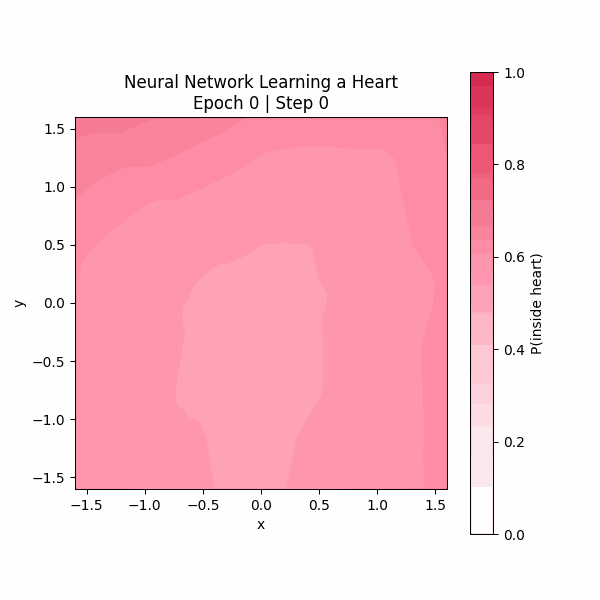

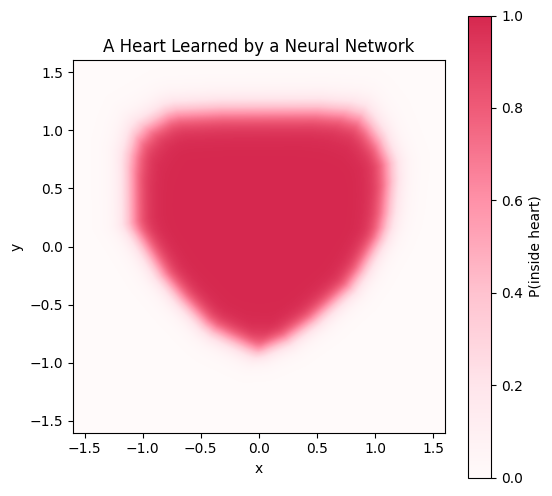

In [1]:
import torch
from torch import nn
from torch.utils import data

import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation, PillowWriter
from matplotlib.colors import LinearSegmentedColormap

from IPython.display import display, Image as IPImage


# =========================================================
# 1. GPU
# =========================================================

device = torch.device(
    "cuda" if torch.cuda.is_available() else "cpu"
)

print("device:", device)

if torch.cuda.is_available():
    print("GPU:", torch.cuda.get_device_name(0))


# =========================================================
# 2. 自定义爱心配色
#
# 低概率：接近白色
# 中间：浅粉
# 高概率：红色
# =========================================================

heart_cmap = LinearSegmentedColormap.from_list(
    "heart",
    [
        "#fffafa",   # 0.0
        "#ffe5eb",
        "#ffc2cf",
        "#ff91a8",
        "#ef5b78",
        "#d6284f"    # 1.0
    ]
)


# =========================================================
# 3. 生成心形数据
# =========================================================

def heart_data(num_examples, low=-1.5, high=1.5):

    # 在二维区域均匀随机采样
    X = (
        (high - low)
        * torch.rand(num_examples, 2)
        + low
    )

    x = X[:, 0]
    y = X[:, 1]

    # 心形真实规则
    f = (
        (x**2 + y**2 - 1)**3
        - (x**2) * (y**3)
    )

    labels = (f <= 0).float()

    labels = labels.reshape(
        num_examples,
        1
    )

    return X, labels


# =========================================================
# 4. Xavier 初始化
# =========================================================

def init_weights(m):

    if isinstance(m, nn.Linear):

        nn.init.xavier_uniform_(
            m.weight
        )

        if m.bias is not None:
            nn.init.zeros_(m.bias)


# =========================================================
# 5. MLP
# =========================================================

net = nn.Sequential(

    nn.Linear(2, 32),
    nn.ReLU(),

    nn.Linear(32, 16),
    nn.ReLU(),

    nn.Linear(16, 1)
)

net.apply(init_weights)

net = net.to(device)


# =========================================================
# 6. 超参数
# =========================================================

num_examples = 30000

batch_size = 256

lr = 0.02

num_epochs = 30


# =========================================================
# 7. Dataset / DataLoader
# =========================================================

X, labels = heart_data(
    num_examples
)

dataset = data.TensorDataset(
    X,
    labels
)

data_iter = data.DataLoader(
    dataset,
    batch_size=batch_size,
    shuffle=True
)


# =========================================================
# 8. Loss / Optimizer
# =========================================================

loss_fn = nn.BCEWithLogitsLoss()

optimizer = torch.optim.SGD(
    net.parameters(),
    lr=lr
)


# =========================================================
# 9. 整个训练集送到 GPU
# 用来计算每个 epoch 的整体 train loss
# =========================================================

X_gpu = X.to(device)

labels_gpu = labels.to(device)


# =========================================================
# 10. 固定二维可视化网格
# =========================================================

grid_size = 320

x_range = torch.linspace(
    -1.6,
    1.6,
    grid_size
)

y_range = torch.linspace(
    -1.6,
    1.6,
    grid_size
)

yy, xx = torch.meshgrid(
    y_range,
    x_range,
    indexing="ij"
)

grid = torch.stack(
    [
        xx.reshape(-1),
        yy.reshape(-1)
    ],
    dim=1
)

grid = grid.to(device)


# =========================================================
# 11. 保存训练过程
# =========================================================

frames = []

frame_steps = []

frame_epochs = []

frame_losses = []


def capture_frame(
    step,
    epoch,
    current_loss=None
):

    net.eval()

    with torch.no_grad():

        logits = net(grid)

        probs = torch.sigmoid(
            logits
        )

        probs = probs.reshape(
            grid_size,
            grid_size
        )

        # matplotlib 需要 CPU numpy
        frames.append(
            probs
            .detach()
            .cpu()
            .numpy()
        )

        frame_steps.append(
            step
        )

        frame_epochs.append(
            epoch
        )

        frame_losses.append(
            current_loss
        )


# =========================================================
# 12. 训练前：随机初始化网络先截一帧
# =========================================================

step = 0

capture_frame(
    step=0,
    epoch=0,
    current_loss=None
)


# =========================================================
# 13. 正式训练
# =========================================================

for epoch in range(num_epochs):

    net.train()

    for xb, yb in data_iter:

        xb = xb.to(device)

        yb = yb.to(device)

        # 清梯度
        optimizer.zero_grad()

        # forward
        y_hat = net(xb)

        # loss
        loss = loss_fn(
            y_hat,
            yb
        )

        # backward
        loss.backward()

        # 更新参数
        optimizer.step()

        step += 1


        # -------------------------------------------------
        # 前期学习变化快，所以高频保存
        # 后期逐渐降低保存频率
        # -------------------------------------------------

        should_capture = False


        if step <= 120:

            if step % 1 == 0:
                should_capture = True


        elif step <= 400:

            if step % 3 == 0:
                should_capture = True


        elif step <= 900:

            if step % 6 == 0:
                should_capture = True


        else:

            if step % 10 == 0:
                should_capture = True


        if should_capture:

            capture_frame(
                step=step,
                epoch=epoch + 1,
                current_loss=loss.item()
            )


    # =====================================================
    # 每个 epoch 结束后
    # 重新计算当前模型的整个训练集 loss
    # =====================================================

    net.eval()

    with torch.no_grad():

        train_loss = loss_fn(
            net(X_gpu),
            labels_gpu
        )


    print(
        f"Epoch {epoch + 1:2d}/{num_epochs}"
        f" | Step {step:4d}"
        f" | Train Loss {train_loss.item():.6f}"
    )


# =========================================================
# 14. 确保最后训练状态也保存
# =========================================================

if frame_steps[-1] != step:

    capture_frame(
        step=step,
        epoch=num_epochs,
        current_loss=train_loss.item()
    )


print()

print("Training finished.")

print(
    "Total optimization steps:",
    step
)

print(
    "Animation frames:",
    len(frames)
)


# =========================================================
# 15. 生成 GIF
# =========================================================

fig, ax = plt.subplots(
    figsize=(6, 6)
)


image = ax.imshow(

    frames[0],

    origin="lower",

    extent=[
        -1.6,
        1.6,
        -1.6,
        1.6
    ],

    vmin=0,

    vmax=1,

    # 注意：
    # 这里没有引号！
    cmap=heart_cmap,

    interpolation="bilinear"
)


ax.set_aspect(
    "equal"
)

ax.set_xlabel(
    "x"
)

ax.set_ylabel(
    "y"
)


title = ax.set_title(
    "Neural Network Learning a Heart\n"
    "Epoch 0 | Step 0"
)


colorbar = plt.colorbar(
    image,
    ax=ax
)

colorbar.set_label(
    "P(inside heart)"
)


# =========================================================
# 16. 每一帧更新
# =========================================================

def update(frame_index):

    image.set_data(
        frames[frame_index]
    )


    ep = frame_epochs[
        frame_index
    ]

    st = frame_steps[
        frame_index
    ]

    ls = frame_losses[
        frame_index
    ]


    if ls is None:

        title.set_text(
            "Neural Network Learning a Heart\n"
            f"Epoch {ep} | Step {st}"
        )

    else:

        title.set_text(
            "Neural Network Learning a Heart\n"
            f"Epoch {ep} | "
            f"Step {st} | "
            f"Loss {ls:.4f}"
        )


    return image, title


# =========================================================
# 17. 创建动画
# =========================================================

animation = FuncAnimation(

    fig,

    update,

    frames=len(frames),

    interval=90,

    blit=False
)


# =========================================================
# 18. 保存 GIF
# =========================================================

gif_name = "heart_learning.gif"


animation.save(

    gif_name,

    writer=PillowWriter(
        fps=12
    )
)


plt.close(fig)


print()

print(
    "GIF saved:",
    gif_name
)


# =========================================================
# 19. Notebook 中播放 GIF
# =========================================================

display(
    IPImage(
        filename=gif_name
    )
)


# =========================================================
# 20. 最终静态图
# =========================================================

net.eval()


with torch.no_grad():

    final_probs = torch.sigmoid(
        net(grid)
    )

    final_probs = final_probs.reshape(
        grid_size,
        grid_size
    )

    final_probs = (
        final_probs
        .cpu()
        .numpy()
    )


plt.figure(
    figsize=(6, 6)
)


plt.imshow(

    final_probs,

    origin="lower",

    extent=[
        -1.6,
        1.6,
        -1.6,
        1.6
    ],

    vmin=0,

    vmax=1,

    cmap=heart_cmap,

    interpolation="bilinear"
)


plt.colorbar(
    label="P(inside heart)"
)

plt.title(
    "A Heart Learned by a Neural Network"
)

plt.xlabel(
    "x"
)

plt.ylabel(
    "y"
)

plt.gca().set_aspect(
    "equal"
)

plt.show()

Original frames: 562
Clean frames: 562
GIF saved: heart_only_clean.gif


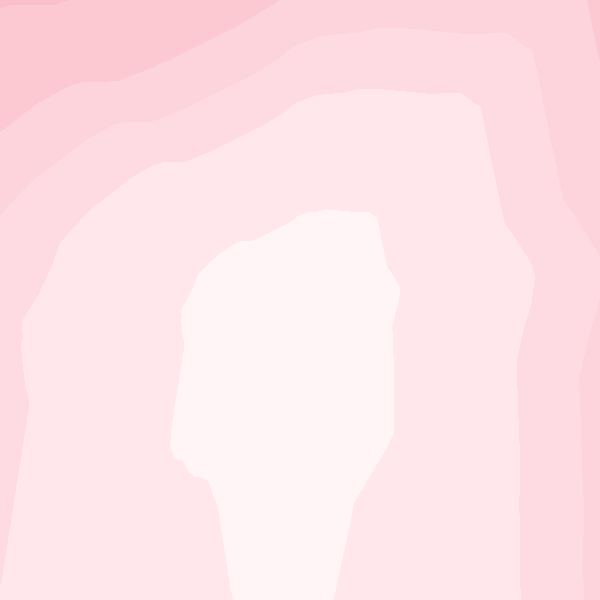

In [2]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation, PillowWriter
from IPython.display import display, Image as IPImage


# =========================================================
# 纯净爱心 GIF
# 白底 / 无文字 / 无坐标 / 无色条
# 只保留“心形逐渐形成”
# =========================================================

# 你可以调这个阈值：
# 越大，背景越干净，但心出现得更晚
threshold = 0.50


def frame_to_rgba(prob_map):
    """
    把模型预测概率图转换成：
    白色背景 + 粉红/红色心形
    """

    # 使用之前定义好的 heart_cmap
    rgba = heart_cmap(prob_map)

    # -----------------------------------------
    # 只让较高概率区域显示出来
    #
    # prob <= threshold     -> 完全透明
    # prob 越高             -> 越不透明
    # -----------------------------------------
    alpha = (prob_map - threshold) / (1.0 - threshold)

    alpha = np.clip(
        alpha,
        0.0,
        1.0
    )

    # 稍微增强一下高概率区域
    alpha = alpha ** 0.7

    rgba[..., 3] = alpha

    return rgba


# =========================================================
# 可选：删掉最开始完全没有结构的帧
# =========================================================

clean_frames = []

for frame in frames:

    # 至少有一定区域超过阈值之后才开始保存
    visible_ratio = np.mean(frame > threshold)

    if visible_ratio > 0.003:
        clean_frames.append(frame)


# 防止过滤太狠
if len(clean_frames) < 10:
    clean_frames = frames


print("Original frames:", len(frames))
print("Clean frames:", len(clean_frames))


# =========================================================
# 创建纯白画布
# =========================================================

fig, ax = plt.subplots(
    figsize=(6, 6),
    facecolor="white"
)

ax.set_facecolor("white")

# 完全去掉坐标、边框
ax.axis("off")

# 让图像铺满整个画布
fig.subplots_adjust(
    left=0,
    right=1,
    bottom=0,
    top=1
)


# =========================================================
# 第一帧
# =========================================================

image = ax.imshow(
    frame_to_rgba(clean_frames[0]),
    origin="lower",
    extent=[-1.6, 1.6, -1.6, 1.6],
    interpolation="bilinear"
)

ax.set_xlim(-1.6, 1.6)
ax.set_ylim(-1.6, 1.6)

ax.set_aspect("equal")


# =========================================================
# 动画更新
# =========================================================

def update_heart(frame_index):

    rgba = frame_to_rgba(
        clean_frames[frame_index]
    )

    image.set_data(rgba)

    return (image,)


# =========================================================
# 创建动画
# =========================================================

animation = FuncAnimation(
    fig,
    update_heart,
    frames=len(clean_frames),
    interval=80,
    blit=True
)


# =========================================================
# 保存 GIF
# =========================================================

gif_name = "heart_only_clean.gif"

animation.save(
    gif_name,
    writer=PillowWriter(
        fps=12
    ),
    savefig_kwargs={
        "facecolor": "white"
    }
)

plt.close(fig)


print("GIF saved:", gif_name)


# =========================================================
# Notebook 中播放
# =========================================================

display(
    IPImage(
        filename=gif_name
    )
)